## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
from matplotlib.patches import Polygon
import numpy as np
import glob

%matplotlib inline

## 1. Compute the camera calibration using chessboard images
* Use chessboard images to obtain image points and object points
* Use the OpenCV functions cv2.calibrateCamera() and cv2.undistort() to compute the calibration and undistortion.
* More information on camera calibration can be found [here](docs/camera_calibration.ipynb).

In [2]:
# Loading camera calibration
cameraCalibration = pickle.load( open('camera_cal/wide_dist_pickle.p', 'rb' ) )
mtx, dist = map(cameraCalibration.get, ('mtx', 'dist'))

In [3]:
# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

In [4]:
# Show images.
def imshow_img(imgs, names, rows=0, cols=0):
    f, ax = plt.subplots(rows, cols, figsize=(24, 9))
    f.tight_layout()
    i = 0
    if rows <= 1 :
        for c in range(cols):
            ax[c].imshow(imgs[i], cmap='gray')
            ax[c].set_title('{}'.format(names[i]), fontsize=24)
            ax[c].axis('off')
            i += 1
    else:
        for r in range(rows):
            for c in range(cols):
                ax[r, c].imshow(imgs[i], cmap='gray')
                ax[r, c].set_title('{}'.format(names[i]), fontsize=24)
                ax[r, c].axis('off')
                i += 1
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 2. Apply a distortion correction to raw images.

In [5]:
def undistort_image(image, mtx, dist):
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    return dst

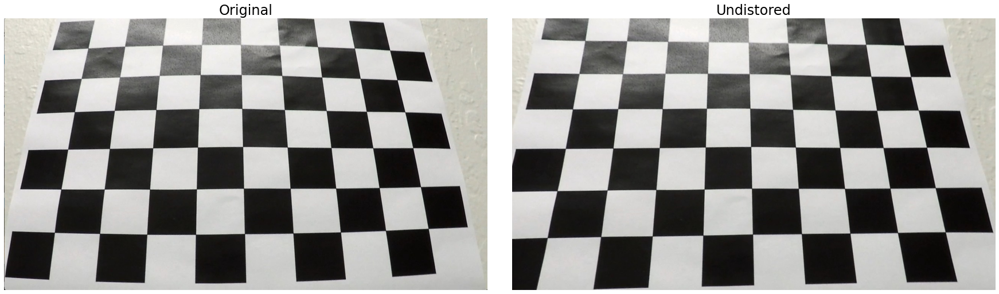

In [6]:
# Raw Test image
image = mpimg.imread(images[0])

# camera calibration raw image
chess_img = mpimg.imread('camera_cal/calibration3.jpg')
und_chess = undistort_image(chess_img, mtx, dist)
cv2.imwrite('output_images/calibration3_r.jpg', und_chess)

imgs = [chess_img, und_chess]
names = ['Original' ,'Undistored']
imshow_img(imgs, names, 1, 2)

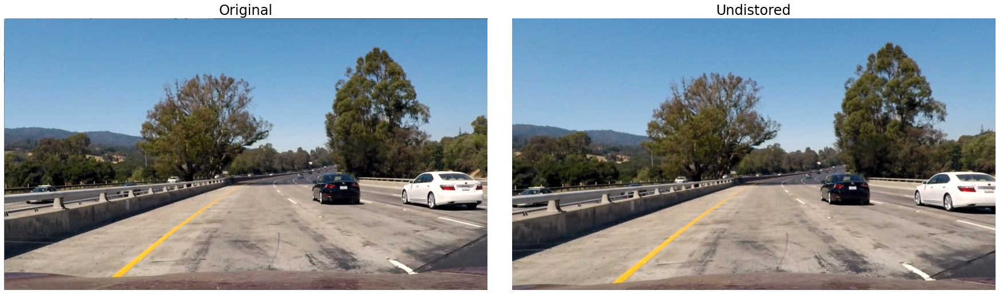

In [7]:
und = undistort_image(image, mtx, dist)    
cv2.imwrite('output_images/test1_und.jpg', und)

# Show results
imgs = [image, und]
names = ['Original' ,'Undistored','','']
imshow_img(imgs, names, 1, 2)

## 3. Use gaussian blur, color transforms, gradients, etc.,  to create a thresholded binary image.

* Use gradient thresholds and different color space to easily identify lane markings on the image

In [8]:
# Applies a Gaussian Noise kerne
def gaussian_blur(image, kernel=5):
    blurred = cv2.GaussianBlur(image, (kernel,kernel), 0)
    return blurred

In [9]:
# Applying the Sobel operator to an image. 
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
        
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel / np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

In [10]:
# Compute the direction of the gradient and apply a threshold. 
# Return the binary_output image
def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely= cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    sobel_arc = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(sobel_arc)
    dir_binary[(sobel_arc >= thresh[0]) & (sobel_arc <= thresh[1])] = 1
    return dir_binary

In [11]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
           
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, [vertices], 1)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    
    return masked_image

In [12]:
def combined_threshold(img):
    
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    height, width = gray.shape
    
    # apply gradient threshold on the horizontal gradient
    sx_binary = abs_sobel_thresh(gray, 'x', 3, (10, 200))
    
    # apply gradient direction threshold so that only edges closer to vertical are detected.
    dir_binary = dir_threshold(gray, thresh=(np.pi/6, np.pi/2))
    
    # combine the gradient and direction thresholds.
    combined_condition = ((sx_binary == 1) & (dir_binary == 1))
    
    # R & G thresholds so that yellow lanes are detected well.
    color_threshold = 150
    R = img[:,:,0]
    G = img[:,:,1]
    color_combined = np.zeros_like(R)
    r_g_condition = (R > color_threshold) & (G > color_threshold)
    
    
    # color channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    L = hls[:,:,1]
    
    # S channel performs well for detecting bright yellow and white lanes
    s_thresh = (100, 255)
    s_condition = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    # We put a threshold on the L channel to avoid pixels which have shadows and as a result darker.
    l_thresh = (120, 255)
    l_condition = (L > l_thresh[0]) & (L <= l_thresh[1])

    # combine all the thresholds
    # A pixel should either be a yellowish or whiteish
    # And it should also have a gradient, as per our thresholds
    color_combined[(r_g_condition & l_condition) & (s_condition | combined_condition)] = 1
    
    # apply the region of interest mask
    vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    combined = region_of_interest(color_combined, vertices)
    
    return combined

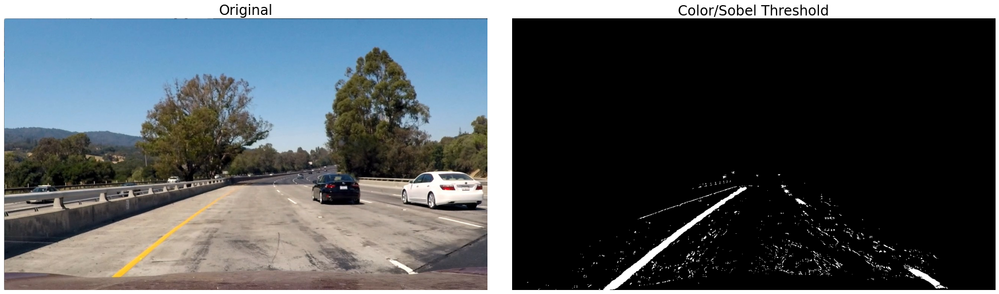

In [13]:
# STEP 2: GAUSSIAN BLUR
blurred = gaussian_blur(und, kernel=3)
# STEP 3: APPLY COLOR SPACE TRANSFORM AND SOBEL THRESHOLDING
combined = combined_threshold(blurred)
cv2.imwrite('output_images/test1_color_th.jpg', combined)
    
# Plot the result
imgs = [image, combined]
names = ['Original' ,'Color/Sobel Threshold']
imshow_img(imgs, names, 1, 2)

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").
* Use cv2.getPerspectiveTransform() to get M, the transform matrix
* Use cv2.warpPerspective() to apply M and warp your image to a top-down view

In [14]:
# Define a function that takes an image, camera matrix and distortion coefficients
# Use cv2.getPerspectiveTransform() to get M, the transform matrix

def perspect_transform(img, src_coordinates, dst_coordinates):    
    img_size = (img.shape[1], img.shape[0])
    
    # Use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src_coordinates, dst_coordinates)
    
    # Compute the inverse perspective transfor also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst_coordinates, src_coordinates)
    
    # Use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv 

Text(0.5, 1.0, 'Warped Image')

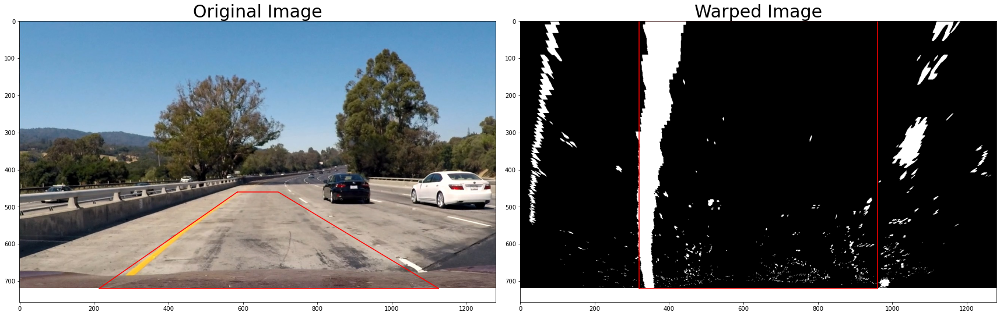

In [15]:
img_size = (image.shape[1], image.shape[0])

src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6)), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])

dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

warped, M, Minv = perspect_transform(image, src, dst)
cv2.imwrite('output_images/test1_warp.jpg', warped)

# Plot the result
imgs = [image, warped]
names = ['Original' ,'Warped (Birds-eye View)']

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()

ax1.imshow(image, cmap='gray')
ax1.plot(Polygon(src).get_xy()[:, 0], Polygon(src).get_xy()[:, 1], color='red')
warped, M, Minv = perspect_transform(combined, src, dst)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(warped, cmap='gray')
ax2.plot(Polygon(dst).get_xy()[:, 0], Polygon(dst).get_xy()[:, 1], color='red')
warped, M, Minv = perspect_transform(combined, src, dst)
ax2.set_title('Warped Image', fontsize=30)

## 5. Detect lane pixels and fit to find the lane boundary.
* Line Finding Method: Peaks in a Histogram

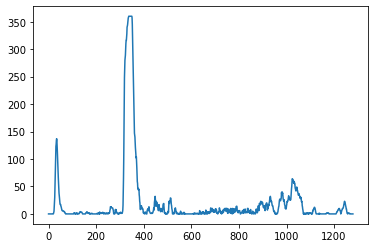

In [16]:
# Line Finding Method: Peaks in a Histogram
def histogram_peak(img):
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:, :]
    histogram = np.sum(bottom_half, axis=0)

    # Peak in the first half indicates the likely position of the left lane
    half_width = np.int(histogram.shape[0]//2)
    leftx_i = np.argmax(histogram[:half_width])

    # Peak in the second half indicates the likely position of the right lane
    rightx_i = np.argmax(histogram[half_width:]) + half_width
    
    return histogram, leftx_i, rightx_i

# Create histogram of image binary activations and get peaks
histogram, leftx_i, rightx_i = histogram_peak(warped)

# Visualize the resulting histogram
plt.plot(histogram)

In [17]:
def find_lane_pixels(binary_warped, return_img=False):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return (left_fit, right_fit), (left_fitx, ploty), (right_fitx, ploty), out_img

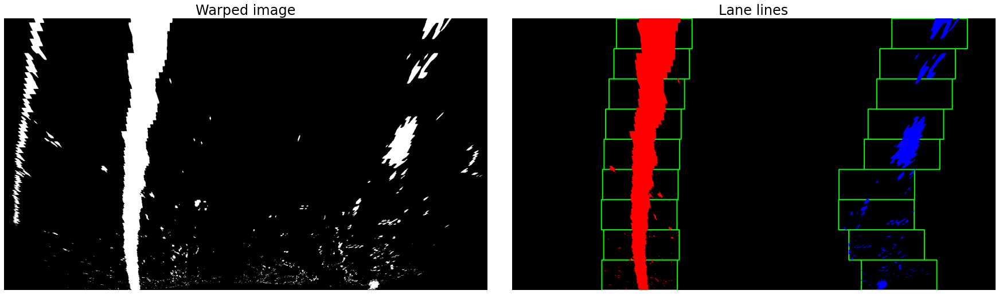

In [18]:
# Run the function
lines_fit, left_points, right_points, out_img = fit_polynomial(warped)

# Plot the result
imgs = [warped, out_img]
names = ['Warped image' ,'Lane lines']
imshow_img(imgs, names, 1, 2)

In [19]:
def search_around_poly(img, line_fits=None, return_img=False):
    if line_fits is None:
        return fit_polynomial(img)    
    
    left_fit = line_fits[0]
    right_fit = line_fits[1]
    
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 100
    
    # Grab activated pixels
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Set the area of search based on activated x-values
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    (left_fit, right_fit), (left_fitx, ploty), (right_fitx, ploty), out_img = fit_polynomial(img)
        
    if return_img:
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((img, img, img))*255
        window_img = np.zeros_like(out_img)

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
     
        for index in range(img.shape[0]):
            cv2.circle(out_img, (int(left_fitx[index]), int(ploty[index])), 3, (255,255,0))
            cv2.circle(out_img, (int(right_fitx[index]), int(ploty[index])), 3, (255,255,0))
    
        return (left_fit, right_fit), (left_fitx, ploty), (right_fitx, ploty), out_img
    
    return (left_fit, right_fit), (left_fitx, ploty), (right_fitx, ploty)

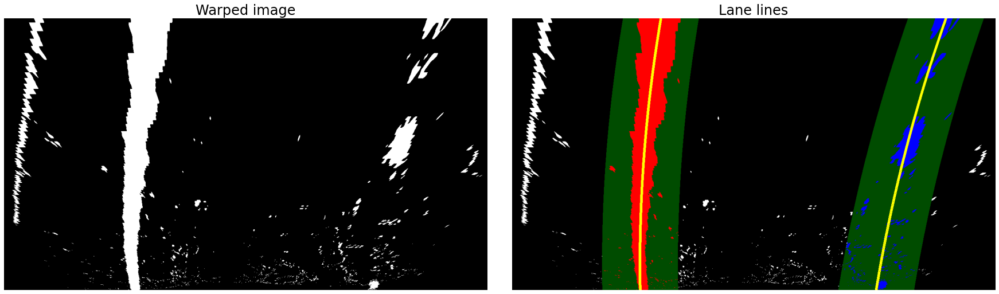

In [20]:
lines_fit, left_points, right_points, out_img = search_around_poly(warped, lines_fit, return_img=True)
cv2.imwrite('output_images/test1_lane.jpg', out_img)

# Plot the result
imgs = [warped, out_img]
names = ['Warped image' ,'Lane lines']
imshow_img(imgs, names, 1, 2)

## 6. Determine the curvature of the lane and vehicle position with respect to center.
* Calculat the radius of curvature for lane lines.

In [21]:
# Calculates the curvature of polynomial functions in meters.
def curvature_radius (leftx, rightx, img_shape):
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
    
    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y
    
    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = np.polyfit(ploty, rightx, 2)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 25/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/800 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Implement the calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad

In [22]:
left_curverad, right_curverad = curvature_radius(leftx=left_points[0], rightx=right_points[0], img_shape = image.shape)

print('Left curvature:', left_curverad, 'm')
print('Right curvature:', right_curverad, 'm')

Left curvature: 994.3215201119009 m
Right curvature: 1012.1396359457385 m


In [23]:
def car_position(leftx, rightx, img_shape):
    ym_per_pix = 25/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/800 # meters per pixel in x dimension

    ## Image mid horizontal position 
    mid_x = img_shape[1]//2
        
    ## Car position
    car_pos = (leftx[-1] + rightx[-1])/2
    
    ## difference distance
    difference = (mid_x - car_pos) * xm_per_pix

    return difference

In [24]:
# Run the function
difference = car_position(leftx=left_points[0], rightx=right_points[0], img_shape=image.shape)

print ('Vehicle is {:.5f} m of center.'.format(difference))

Vehicle is -0.05405 m of center.


## 7. Warp the detected lne boundaries back onto the original image.

In [25]:
def draw_lane(img, warped_img, left_points, right_points, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fitx = left_points[0]
    right_fitx = right_points[0]
    ploty = left_points[1]

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 

    # Combine the result with the original image
    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)

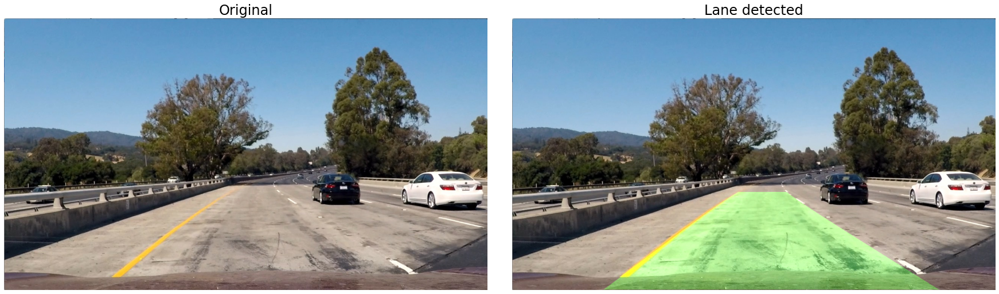

In [26]:
# Run the function
img_lane = draw_lane(image, warped, left_points, right_points, Minv)
cv2.imwrite('output_images/test1_lane_detect.jpg', img_lane)

# Plot the result
imgs = [image, img_lane]
names = ['Original' ,'Lane detected']
imshow_img(imgs, names, 1, 2)

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [27]:
def display(img, leftx, rightx):    
    # Calculate radius of curvature
    left_curverad, right_curverad = curvature_radius(leftx=leftx, rightx=rightx, img_shape=img.shape)
    # Calculate car offset
    difference = car_position(leftx=leftx, rightx=rightx, img_shape=img.shape)

    # Display lane curvature and difference distance
    out_img = img.copy()
    cv2.putText(out_img, 'Left curvature: {:.2f} m'.format(left_curverad), 
                (60, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    cv2.putText(out_img, 'Right curvature: {:.2f} m'.format(right_curverad), 
                (60, 110), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    cv2.putText(out_img, 'Vehicle is {:.5f} m of center.'.format(difference), 
                (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    return out_img

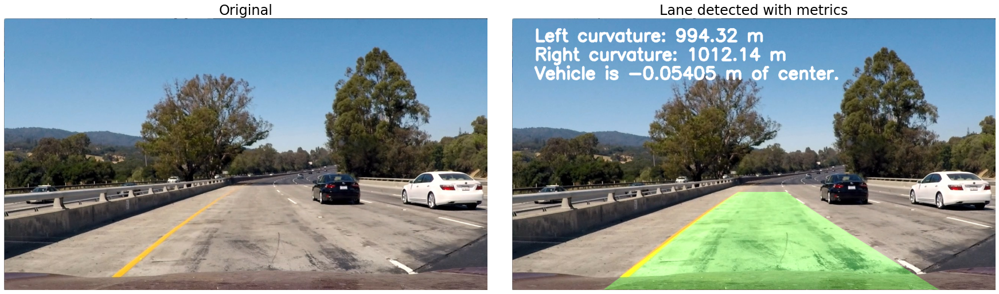

In [28]:
out_img = display(img_lane, leftx=left_points[0], rightx=right_points[0])
cv2.imwrite('output_images/test1_final.jpg', out_img)

# Plot the result
imgs = [image, out_img]
names = ['Original' ,'Lane detected with metrics']
imshow_img(imgs, names, 1, 2)

## 9. Define a Line() class to keep track of all the parameters from frame to frame. 

In [29]:
class Line:
    def __init__(self):
        
        # Loading camera calibration
        cameraCalibration = pickle.load( open('camera_cal/wide_dist_pickle.p', 'rb' ) )
        self.mtx, self.dist = map(cameraCalibration.get, ('mtx', 'dist'))
        
        # Reinitialize 
        self.lines_fit = None

    def __call__(self, img):
        
       
        undistorted = undistort_image(img, self.mtx, self.dist)
        blurred = gaussian_blur(undistorted, kernel=3)
        combined = combined_threshold(blurred)
        
        src = np.float32(
            [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
            [((img_size[0] / 6)), img_size[1]],
            [(img_size[0] * 5 / 6) + 60, img_size[1]],
            [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])

        dst = np.float32(
            [[(img_size[0] / 4), 0],
            [(img_size[0] / 4), img_size[1]],
            [(img_size[0] * 3 / 4), img_size[1]],
            [(img_size[0] * 3 / 4), 0]])

        warped, M, Minv = perspect_transform(combined, src, dst)
        self.lines_fit, left_points, right_points, out_img = search_around_poly(warped, self.lines_fit, return_img=True,)
        img_lane = draw_lane(img, warped, left_points, right_points, Minv)
        out_img = display(img_lane, leftx=left_points[0], rightx=right_points[0])
            
        return out_img

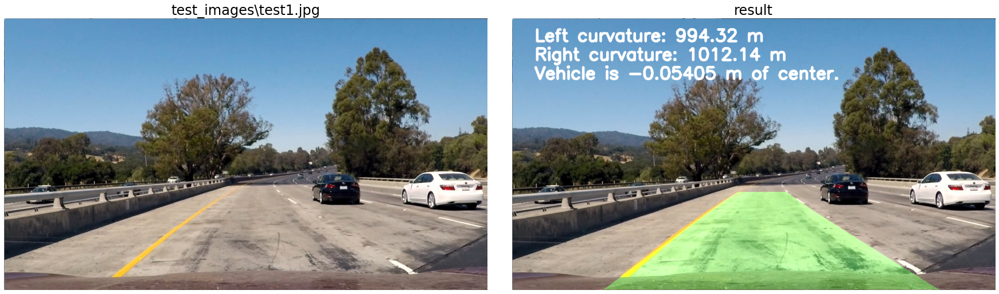

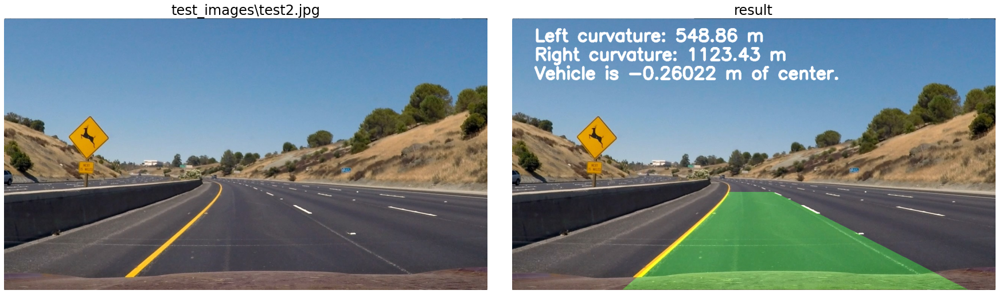

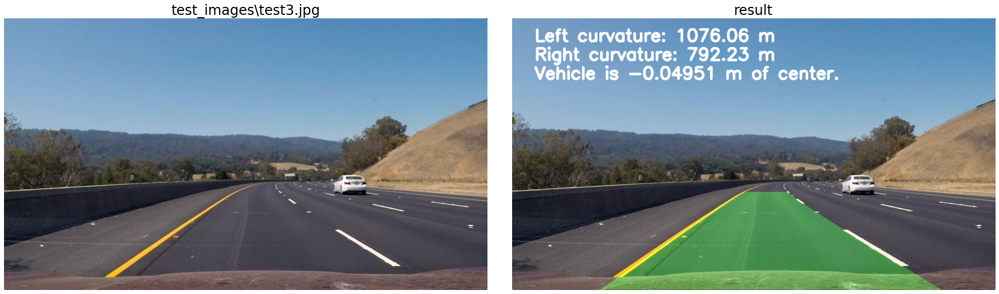

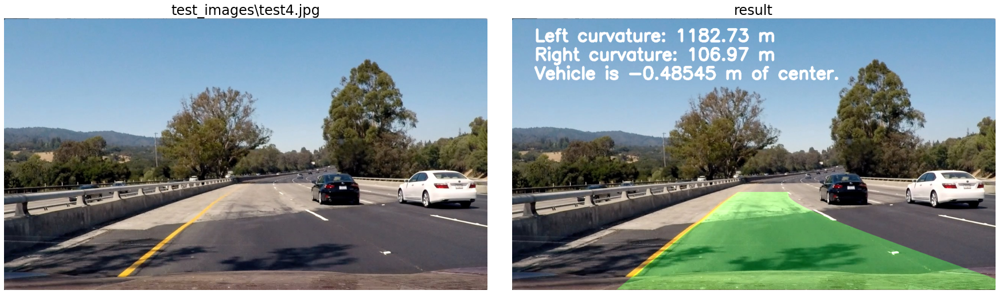

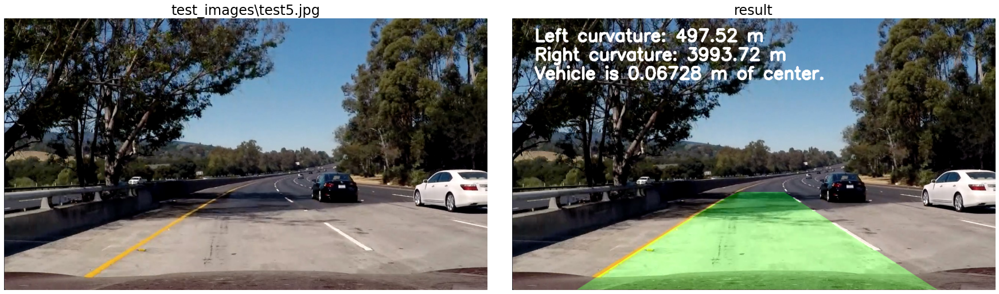

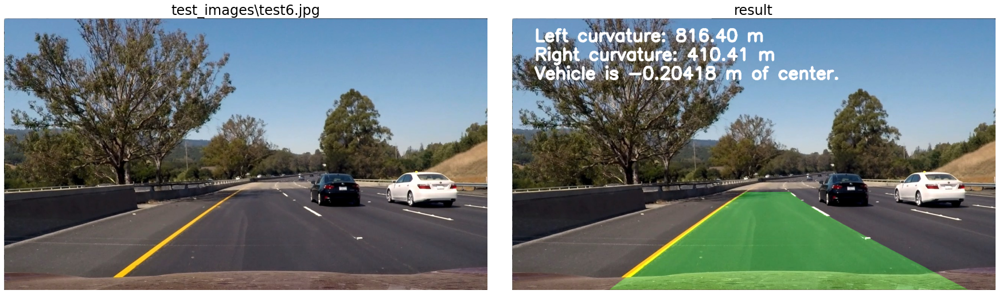

In [30]:
for image_path in images:
    image = mpimg.imread(image_path)
    pipeline = Line()
    result = pipeline(image)                 
    
    # Plot the result
    imgs = [image, result]
    names = [image_path ,'result']
    imshow_img(imgs, names, 1, 2)    

In [31]:
def apply_video(input_video, output_video):

    # Process video frames with our 'process_image' function
    process_image = Line()
    
    #clip1 = VideoFileClip(input_video).subclip(0,5)
    clip1 = VideoFileClip(input_video)
    white_clip = clip1.fl_image(process_image)
    %time white_clip.write_videofile(output_video, audio=False)
    
    print("Apply video pipeline: SUCCESS!")

In [32]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [33]:
input_video = './project_video.mp4'
output_video = './project_video_output.mp4'

apply_video(input_video, output_video)

t:   0%|                                                                            | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video ./project_video_output.mp4.
Moviepy - Writing video ./project_video_output.mp4



Moviepy - Done !
Moviepy - video ready ./project_video_output.mp4
Wall time: 3min 51s
Apply video pipeline: SUCCESS!


In [34]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))